<a href="https://colab.research.google.com/github/D1VORY/pruning_neural_networks/blob/main/Functional_prunning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import tensorflow as tf
import cv2

import keras
from keras.models import Sequential
from keras.layers import (
    Input, 
    Dense, 
    Activation, 
    Flatten, 
    Conv2D,
    MaxPooling2D,
    Dropout,
    Lambda,
    ZeroPadding2D,
    MaxPool2D,
    BatchNormalization
)
from keras import backend as K

from keras import  losses
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from keras import applications
from sklearn.cluster import KMeans
from google.colab.patches import cv2_imshow

!pip install cached-property
from cached_property import cached_property

**prune model**

1.   define filter functionality through AM visualization
2.   find filters with similar functionality with proper similarity analisys. filters with repetitive functionalities are clustered together.
3.   



**AM visualization:**

For each filter in Conv layer:
 

1.   Randomly initialize values of input image for a filter
2.   Change the values of this input image with use of gradient ascent
3.   Eventually, X demonstrates a specific visualized pattern V which contains
the filter’s most sensitive input features with certain semantics, and represents the filter’s functional preference for feature extraction






In [ ]:
class FuncPrunningModel:
    def __init__(self):
        pass

    
    def prune(self):
       pass



In [ ]:
class LayerFiltersMaxActivation:
    def __init__(self, model, layer, input_image_shape=(180, 180, 3), learning_rate = 10.0, learning_iterations = 30):
        self.model = model
        self.layer = layer
        self.filters_activation_maps = []
        self.filters_activation_losses = []

        self.feature_extractor = keras.Model(inputs=self.model.inputs, outputs=self.layer.output)
        self.input_image_shape = input_image_shape
        self.filters_number = self.layer.get_config()['filters']
        self.learning_rate = learning_rate
        self.learning_iterations = learning_iterations


    def compute_layer_filters_max_activations(self):
        for filter_index in range(self.filters_number):
            loss, img = self.filter_synthesis(filter_index)
            self.filters_activation_maps.append(img)
            self.filters_activation_losses.append(loss)

    def compute_loss(self, input_image, filter_index):
        activation = self.feature_extractor(input_image)
        # We avoid border artifacts by only involving non-border pixels in the loss.
        filter_activation = activation[:, 2:-2, 2:-2, filter_index]
        return tf.reduce_mean(filter_activation)

    @tf.function
    def gradient_ascent_step(self, img, filter_index, learning_rate):
        with tf.GradientTape() as tape:
            tape.watch(img)
            loss = self.compute_loss(img, filter_index)
        # Compute gradients.
        grads = tape.gradient(loss, img)
        # Normalize gradients.
        grads = tf.math.l2_normalize(grads)
        img += learning_rate * grads
        return loss, img

    def initialize_image(self):
        # initialize image with random values
        img = tf.random.uniform((1, *self.input_image_shape))
        return img


    def filter_synthesis(self, filter_index):
        # We run gradient ascent for 20 steps
        iterations = 30
        img = self.initialize_image()
        for iteration in range(iterations):
            loss, img = self.gradient_ascent_step(img, filter_index, self.learning_rate)

        # Decode the resulting input image
        img = self.deprocess_image(img[0].numpy())
        return loss, img


    def deprocess_image(self, img):
        # Center crop
        img -= img.mean()
        img /= img.std() + 1e-5
        img *= 0.15

        # Center crop
        img = img[25:-25, 25:-25, :]

        # Clip to [0, 1]
        img += 0.5
        img = np.clip(img, 0, 1)

        # Convert to RGB array
        img *= 255
        img = np.clip(img, 0, 255).astype("uint8")

        return img

    def show_images(self):
        # Build a black picture with enough space for
        # our 8 x 8 filters of size 128 x 128, with a 5px margin in between
        margin = 5
        n = 8
        cropped_width = self.input_image_shape[0] - 25 * 2
        cropped_height = self.input_image_shape[1] - 25 * 2
        width = n * cropped_width + (n - 1) * margin
        height = n * cropped_height + (n - 1) * margin
        stitched_filters = np.zeros((width, height, 3))

        # Fill the picture with our saved filters
        for i in range(n):
            for j in range(n):
                img = self.filters_activation_maps[i * n + j]
                stitched_filters[
                    (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
                    (cropped_height + margin) * j : (cropped_height + margin) * j
                    + cropped_height,
                    :,
                ] = img
        keras.preprocessing.image.save_img("stiched_filters.png", stitched_filters)

        from IPython.display import Image, display

        display(Image("stiched_filters.png"))

    

In [ ]:
class LayerFiltersClusterization:
    def __init__(self, model,k, layer_max_activation: LayerFiltersMaxActivation):
        self.model = model
        self.layer = layer_max_activation.layer

        self.filters_activation_maps = np.array(layer_max_activation.filters_activation_maps)
        self.filters_num = layer_max_activation.filters_number

        self.clusters_num = k
        self.clusters = []
        self.labels = []
        self.score = None

    @cached_property
    def flattened_activation_maps(self):
        old_shape = self.filters_activation_maps.shape
        print(old_shape)
        newshape=(old_shape[0], old_shape[1]*old_shape[2]*old_shape[3])
        flattened_maps = np.reshape(self.filters_activation_maps, newshape)
        return flattened_maps

    @cached_property
    def images_indices_in_clusters(self):
        arr = [[] for _ in range(self.clusters_num)]
        for filter_index, cluster_index in enumerate(self.labels):
            arr[cluster_index].append(filter_index)
        return arr

    def clasterize_activation_maps(self, max_iter= 300, random_state=0):
        kmeans = KMeans(self.clusters_num, max_iter= max_iter, random_state=random_state).fit(self.flattened_activation_maps)
        self.labels = kmeans.predict(self.flattened_activation_maps)
        self.score = kmeans.score(self.flattened_activation_maps)

    def find_extremely_close_filters(self,cluster_index, threshold):
        """
        for all activation maps in a cluster find maps that extremely minimal similar to other maps in cluster
        """
        maps_in_cluster = self.images_indices_in_clusters[cluster_index]
        
        #for every filter in cluster
        #find euc distance from one filter to all others
        #

    def show_images_in_cluster(self, cluster_index):
        imgs = np.hstack([self.filters_activation_maps[filter_index] for filter_index in self.images_indices_in_clusters[cluster_index]])
        
        cv2_imshow(imgs)

    def show_images_in_clusters(self):
        plt.rcParams["figure.figsize"] = (40,6)
        plt.rcParams["figure.dpi"] =  300
        for cluster_index in range(self.clusters_num):
            imgs_in_cluster = np.hstack([self.filters_activation_maps[filter_index] for filter_index in self.images_indices_in_clusters[cluster_index]])
            title=f'cluster index: {cluster_index}'
            #Row, column, index
            plt.subplot(self.clusters_num, 1, cluster_index+1)

            plt.imshow(imgs_in_cluster)
            plt.title(title,fontsize=8)
            plt.xticks([])
            plt.yticks([])
        plt.show()

In [ ]:
class FilterSignificance:
    def __init__(self, )

In [ ]:
model  = keras.models.load_model('/content/drive/My Drive/datasets/birds/models/v2/birdModel.h5')

In [ ]:
model.summary()

In [ ]:
layer = model.layers[2]

In [ ]:
layer.output

<KerasTensor: shape=(None, 220, 220, 128) dtype=float32 (created by layer 'conv2d_1')>

In [ ]:
activ = LayerFiltersMaxActivation(model, layer, input_image_shape=(224,224,3))


In [ ]:
activ.compute_layer_filters_max_activations()


In [ ]:
activ.show_images()

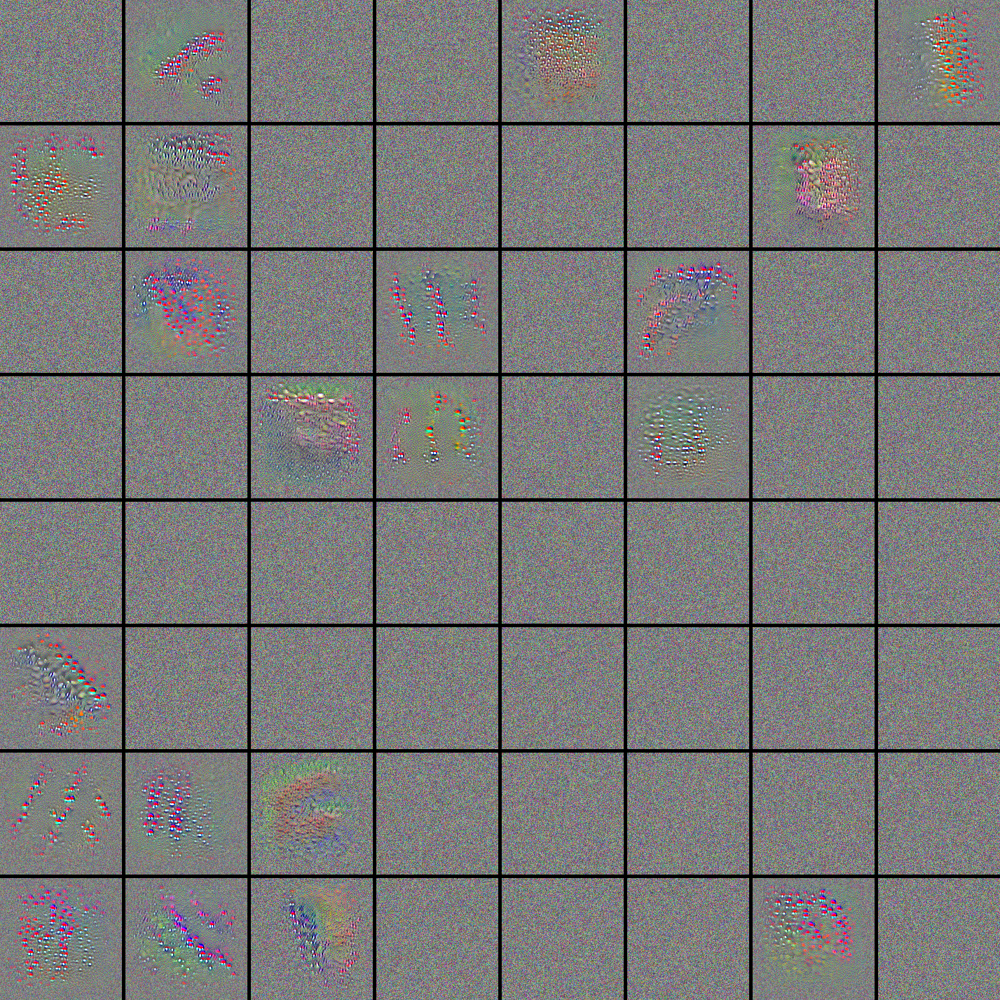

In [ ]:
b = model.layers[15]
activ2 = LayerFiltersMaxActivation(model, b, input_image_shape=(224,224,3),learning_rate=5, learning_iterations=80)
activ2.compute_layer_filters_max_activations()
activ2.show_images()

In [ ]:
clustering = LayerFiltersClusterization(model, 20, activ)
clustering.clasterize_activation_maps()

(128, 174, 174, 3)


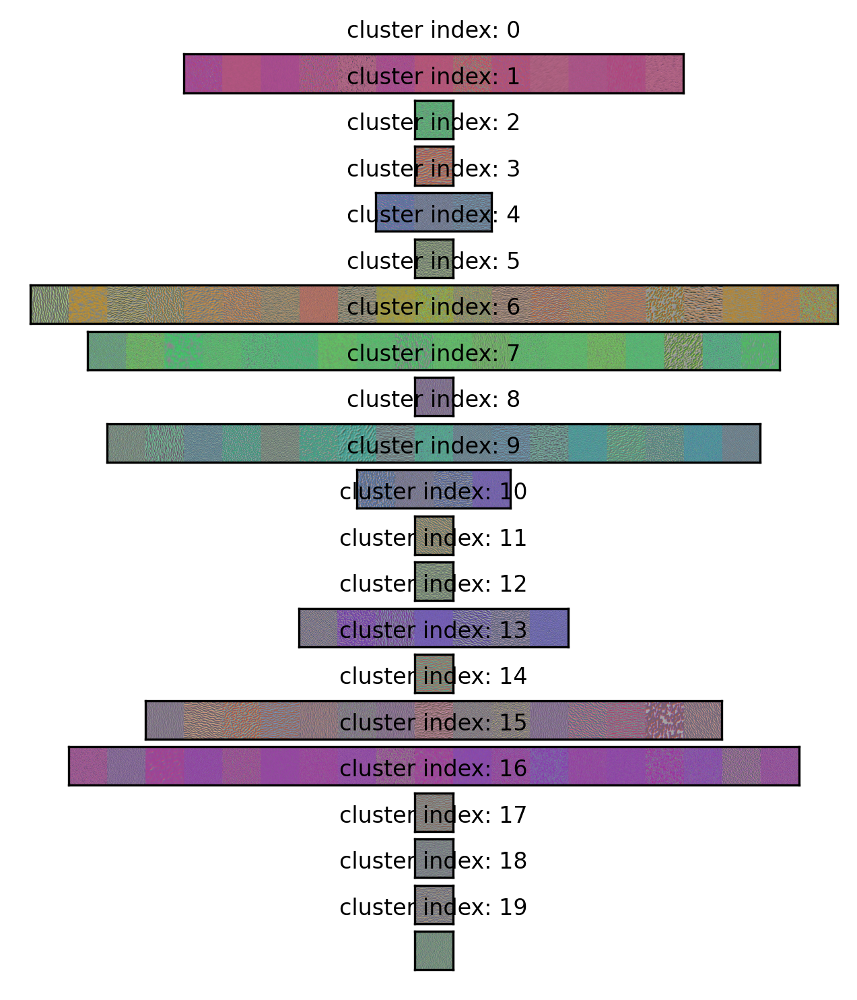

In [ ]:
clustering.show_images_in_clusters()

In [ ]:
clustering2 = LayerFiltersClusterization(model, 20, activ2)
clustering2.clasterize_activation_maps()

(256, 174, 174, 3)


In [ ]:
clustering2.show_images_in_clusters()

KeyboardInterrupt: ignored

In [ ]:
vgg = keras.applications.vgg16.VGG16(weights="imagenet", include_top=False)


58892288/58889256 [==============================] - 1s 0us/step


In [ ]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

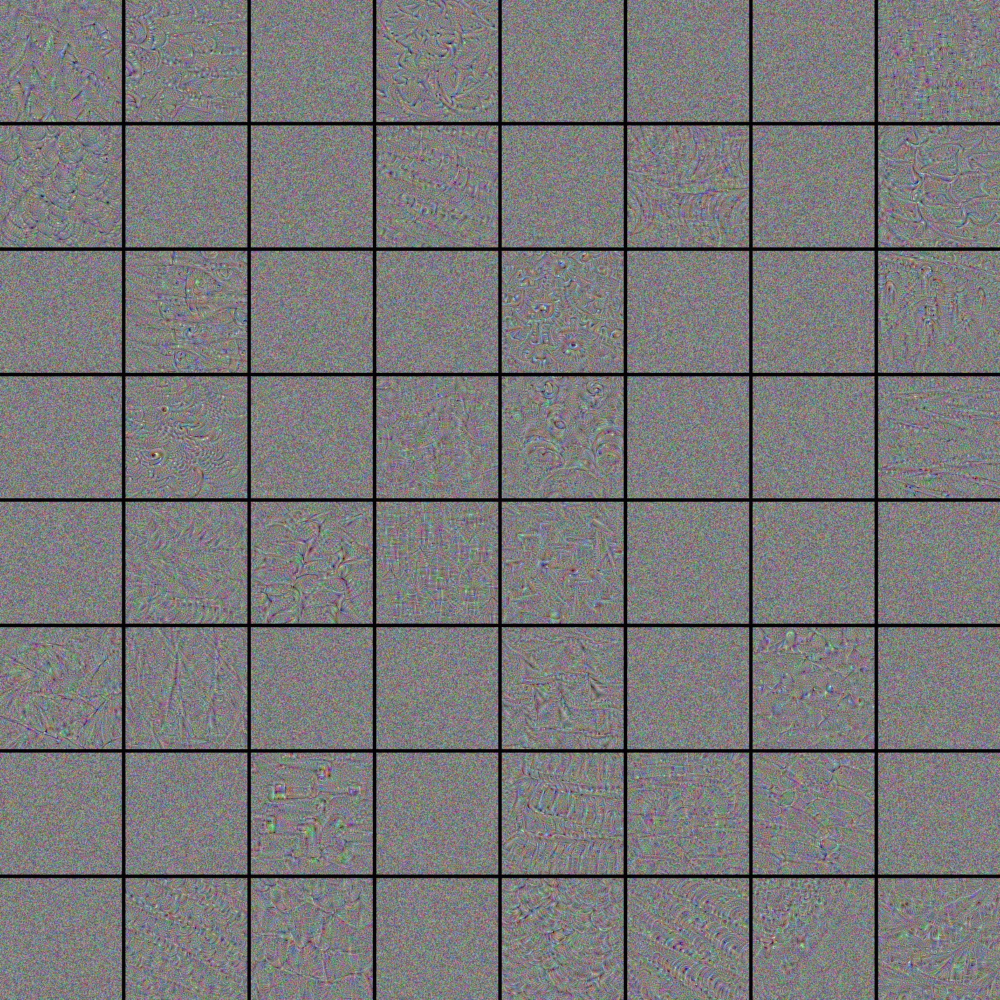

In [ ]:
layer_conv2_1 = vgg.get_layer(name='block5_conv2')
layer_conv2_1.weights[0].shape

activ3 = LayerFiltersMaxActivation(vgg, layer_conv2_1, input_image_shape=(224,224,3),learning_rate=2, learning_iterations=80)
activ3.compute_layer_filters_max_activations()
activ3.show_images()

In [ ]:
clustering3 = LayerFiltersClusterization(vgg, 30, activ3)
clustering3.clasterize_activation_maps()


(512, 174, 174, 3)


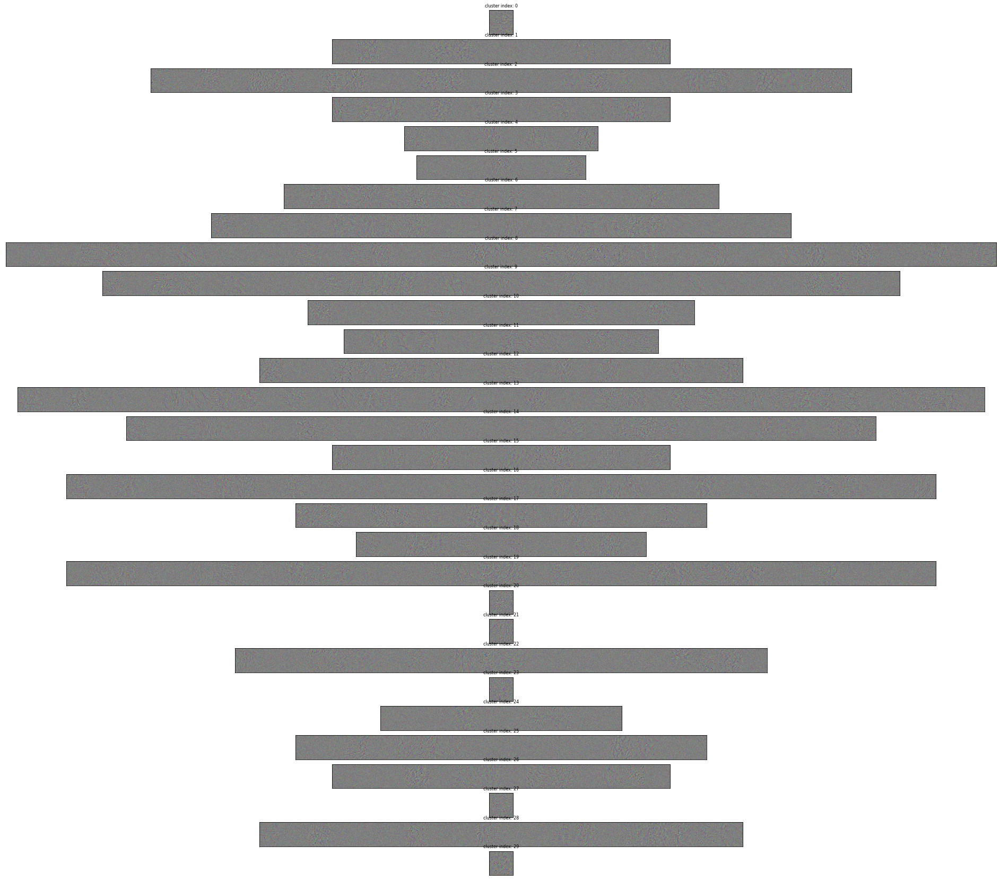

In [ ]:
clustering3.show_images_in_clusters()

In [ ]:
b